**Note**: videos will generally not embed well into jupyter notebooks online or in PDFs of the notebook. For videos of the agent see the [following folder](https://github.com/NiklasZ/decision-transformers-example/tree/main/video) in the repository.

----

The following is a [decision transformer](https://arxiv.org/pdf/2106.01345.pdf) implementation for the [2D Walker Environment](https://mgoulao.github.io/gym-docs/environments/mujoco/walker2d/). This architecture is trained using a offline policy reinforcement learning, meaning it learns from trajectories $\tau_1 ... \tau_n$ acquired from another agent where $\tau_i = (s_0, a_0, r_0, s_1, a_1, r_1, .... s_T, a_T, r_T)$. During each timestep, the transformer takes in a window of previous states, actions and future desired returns in order to generate a next action. Here, *future desired return* refers to the remaining return that the agent needs to obtain during the rest of the episode. What the decision transformer learns, is what action it needs to take in order to get this future desired return. This raises a few interesting questions:

1. After training the transformer to choose the actions for some future return $R'$, can we prompt it to find actions for some better future return $\hat{R} > R'$?
2. If 1. is possible, then we can sample new trajectories with better returns from the environment using the transformer. Can we do this iteratively to generate increasingly better trajectories and policies from the transformer?

The answer to both questions is "yes" based on the [original paper]((https://arxiv.org/pdf/2106.01345.pdf)) and an [extension](https://proceedings.mlr.press/v162/zheng22c/zheng22c.pdf) written later. In this notebook, we'll mostly go about the first question and provide some results that set the stage for the second question.

In [2]:
import random
from dataclasses import dataclass
import numpy as np
import torch
from datasets import load_dataset
from transformers import DecisionTransformerConfig, DecisionTransformerModel, Trainer, TrainingArguments
import mujoco_py
import gym
from colabgymrender.recorder import Recorder
from tqdm import tqdm
import matplotlib.pyplot as plt
from typing import List

# Training Data
The training data is composed of two datasets:

- `walker2d-medium-v2` - 1190 trajectories from a medium-level agent's replay buffer
- `walker2d-expert-v2` - 1000 trajectories from an expert-level agent's replay buffer

Where each trajectory can have a maximum of $T=1000$ timesteps. Note also that we are using trajectories from a replay buffer (presumably from a DQN or similar). This means there will likely be a range of trajectories from different training steps. This will hopefully prevent some overfitting by the transformer. Before we can use the data for training, there are also a number of pre-processing steps such as z-scoring of the state, cutting the trajectories into 20 chunk windows, padding and more. See below for the implementation.

In [21]:
dataset_names = ['walker2d-medium-v2', 'walker2d-expert-v2']
datasets = [load_dataset("edbeeching/decision_transformer_gym_replay", n) for n in dataset_names]

Found cached dataset decision_transformer_gym_replay (/home/niklasz/.cache/huggingface/datasets/edbeeching___decision_transformer_gym_replay/walker2d-medium-v2/1.1.0/8a8520881dd09333b04f5a116dd47931314ec44b72597bce8675d40ccd42ad88)


  0%|          | 0/1 [00:00<?, ?it/s]

Found cached dataset decision_transformer_gym_replay (/home/niklasz/.cache/huggingface/datasets/edbeeching___decision_transformer_gym_replay/walker2d-expert-v2/1.1.0/8a8520881dd09333b04f5a116dd47931314ec44b72597bce8675d40ccd42ad88)


  0%|          | 0/1 [00:00<?, ?it/s]

In [22]:
# Note: parts of this code are based off of https://huggingface.co/blog/train-decision-transformers
@dataclass
class DecisionTransformerGymDataCollator:
    return_tensors: str = "pt"
    max_len: int = 20  # subsets of the episode we use for training
    state_dim: int = 17  # size of state space
    act_dim: int = 6  # size of action space
    max_ep_len: int = 1000  # max episode length in the dataset
    scale: float = 1000.0  # normalization of rewards/returns
    state_mean: np.array = None  # to store state means
    state_std: np.array = None  # to store state stds
    p_sample: np.array = None  # a distribution to take account trajectory lengths
    n_traj: int = 0  # to store the number of trajectories in the dataset

    def __init__(self, dataset) -> None:
        self.act_dim = len(dataset[0]["actions"][0])
        self.state_dim = len(dataset[0]["observations"][0])
        self.dataset = dataset

        # Calculate dataset stats for normalization of states
        states, traj_lens = self._calculate_dataset_stats(dataset)

        self.n_traj = len(traj_lens)
        self.state_mean, self.state_std = np.mean(states, axis=0), np.std(states, axis=0) + 1e-6
        self.p_sample = traj_lens / sum(traj_lens)

    def _calculate_dataset_stats(self, dataset):
        states = []
        traj_lens = []

        for obs in dataset["observations"]:
            states.extend(obs)
            traj_lens.append(len(obs))

        return np.vstack(states), np.array(traj_lens)

    def _discount_cumsum(self, x, gamma):
        discount_cumsum = np.zeros_like(x)
        discount_cumsum[-1] = x[-1]

        for t in reversed(range(x.shape[0] - 1)):
            discount_cumsum[t] = x[t] + gamma * discount_cumsum[t + 1]

        return discount_cumsum

    def __call__(self, features):
        batch_size = len(features)

        # Sample from a non-uniform distribution
        batch_inds = np.random.choice(
            np.arange(self.n_traj),
            size=batch_size,
            replace=True,
            p=self.p_sample,  # Reweights so we sample according to timesteps
        )

        # Process and gather batch data
        batch_data = self._process_batch_data(batch_inds)

        return {
            "states": batch_data["states"],
            "actions": batch_data["actions"],
            "rewards": batch_data["rewards"],
            "returns_to_go": batch_data["returns_to_go"],
            "timesteps": batch_data["timesteps"],
            "attention_mask": batch_data["mask"],
        }

    def _process_batch_data(self, batch_inds):
        s, a, r, d, rtg, timesteps, mask = [], [], [], [], [], [], []

        for ind in batch_inds:
            feature = self.dataset[int(ind)]
            si = random.randint(0, len(feature["rewards"]) - 1)

            # Get sequences from dataset
            s.append(np.array(feature["observations"][si: si + self.max_len]).reshape(1, -1, self.state_dim))
            a.append(np.array(feature["actions"][si: si + self.max_len]).reshape(1, -1, self.act_dim))
            r.append(np.array(feature["rewards"][si: si + self.max_len]).reshape(1, -1, 1))
            d.append(np.array(feature["dones"][si: si + self.max_len]).reshape(1, -1))
            timesteps.append(np.arange(si, si + s[-1].shape[1]).reshape(1, -1))
            timesteps[-1][timesteps[-1] >= self.max_ep_len] = self.max_ep_len - 1  # padding cutoff
            rtg.append(
                self._discount_cumsum(np.array(feature["rewards"][si:]), gamma=1.0)[
                    : s[-1].shape[1]
                ].reshape(1, -1, 1)
            )

            # Padding and state + reward normalization
            tlen = s[-1].shape[1]
            s, a, r, d, rtg, timesteps, mask = self._apply_padding_and_normalization(s, a, r, d, rtg, timesteps, mask, tlen)

        s = torch.from_numpy(np.concatenate(s, axis=0)).float()
        a = torch.from_numpy(np.concatenate(a, axis=0)).float()
        r = torch.from_numpy(np.concatenate(r, axis=0)).float()
        rtg = torch.from_numpy(np.concatenate(rtg, axis=0)).float()
        timesteps = torch.from_numpy(np.concatenate(timesteps, axis=0)).long()
        mask = torch.from_numpy(np.concatenate(mask, axis=0)).float()

        return {
            "states": s,
            "actions": a,
            "rewards": r,
            "returns_to_go": rtg,
            "timesteps": timesteps,
            "mask": mask,
        }

    def _apply_padding_and_normalization(self, s, a, r, d, rtg, timesteps, mask, tlen):
        s[-1] = np.concatenate([np.zeros((1, self.max_len - tlen, self.state_dim)), s[-1]], axis=1)
        s[-1] = (s[-1] - self.state_mean) / self.state_std
        a[-1] = np.concatenate(
            [np.ones((1, self.max_len - tlen, self.act_dim)) * -10.0, a[-1]],
            axis=1,
        )
        r[-1] = np.concatenate([np.zeros((1, self.max_len - tlen, 1)), r[-1]], axis=1)
        d[-1] = np.concatenate([np.ones((1, self.max_len - tlen)) * 2, d[-1]], axis=1)
        rtg[-1] = np.concatenate([np.zeros((1, self.max_len - tlen, 1)), rtg[-1]], axis=1) / self.scale
        timesteps[-1] = np.concatenate([np.zeros((1, self.max_len - tlen)), timesteps[-1]], axis=1)
        mask.append(np.concatenate([np.zeros((1, self.max_len - tlen)), np.ones((1, tlen))], axis=1))

        return s, a, r, d, rtg, timesteps, mask

# Decision Transformer Architecture
We use the built-in decision transformer provided by huggingface. The mean-squared-error (MSE) is used as the loss function for predicted vs. target actions. This works as the 2D Walker Environment uses continuous action values ranging from $[-1,1]$, so the distance between the predicted and target actions is meaningful.

In [23]:
class TrainableDT(DecisionTransformerModel):
    def __init__(self, config):
        super().__init__(config)

    def forward(self, **kwargs):
        output = super().forward(**kwargs)
        loss = self.calculate_loss(output, kwargs)
        return {"loss": loss}

    def calculate_loss(self, output, inputs):
        action_preds = output[1]
        action_targets = inputs["actions"]
        attention_mask = inputs["attention_mask"]
        act_dim = action_preds.shape[2]
        action_preds = action_preds.reshape(-1, act_dim)[attention_mask.reshape(-1) > 0]
        action_targets = action_targets.reshape(-1, act_dim)[attention_mask.reshape(-1) > 0]

        loss = torch.mean((action_preds - action_targets) ** 2)
        return loss

    def original_forward(self, **kwargs):
        return super().forward(**kwargs)

# Training

The models are each trained for 120 epochs (see below for additional hyper-parameters).

In [ ]:
models = []
collators = []
for dataset,n in zip(datasets, dataset_names):
    print(f'Training on {n}')
    collator = DecisionTransformerGymDataCollator(dataset["train"])
    config = DecisionTransformerConfig(state_dim=collator.state_dim, act_dim=collator.act_dim)
    model = TrainableDT(config)
    models.append(model)
    collators.append(collator)

    training_args = TrainingArguments(
        output_dir="output/",
        remove_unused_columns=False,
        num_train_epochs=120,
        per_device_train_batch_size=64,
        learning_rate=1e-4,
        weight_decay=1e-4,
        warmup_ratio=0.1,
        optim="adamw_torch",
        max_grad_norm=0.25,
    )

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=dataset["train"],
        data_collator=collator,
    )

    trainer.train()

Training on walker2d-medium-v2


Step,Training Loss
500,0.173800
1000,0.068400
1500,0.060900
2000,0.057800


Training on walker2d-expert-v2


Step,Training Loss
500,0.132100
1000,0.046200
1500,0.041600


# Evaluation

We then require some additional logic to run evaluation episodes using the transformer.

In [39]:
# Function that gets an action from the model using autoregressive prediction with a window of the previous 20 timesteps.
def get_action(model, states, actions, rewards, returns_to_go, timesteps):
    # This implementation does not condition on past rewards
    states = states.reshape(1, -1, model.config.state_dim)
    actions = actions.reshape(1, -1, model.config.act_dim)
    returns_to_go = returns_to_go.reshape(1, -1, 1)
    timesteps = timesteps.reshape(1, -1)

    states = states[:, -model.config.max_length :]
    actions = actions[:, -model.config.max_length :]
    returns_to_go = returns_to_go[:, -model.config.max_length :]
    timesteps = timesteps[:, -model.config.max_length :]
    padding = model.config.max_length - states.shape[1]
    # pad all tokens to sequence length
    attention_mask = torch.cat([torch.zeros(padding), torch.ones(states.shape[1])])
    attention_mask = attention_mask.to(dtype=torch.long).reshape(1, -1)
    states = torch.cat([torch.zeros((1, padding, model.config.state_dim)), states], dim=1).float()
    actions = torch.cat([torch.zeros((1, padding, model.config.act_dim)), actions], dim=1).float()
    returns_to_go = torch.cat([torch.zeros((1, padding, 1)), returns_to_go], dim=1).float()
    timesteps = torch.cat([torch.zeros((1, padding), dtype=torch.long), timesteps], dim=1)

    state_preds, action_preds, return_preds = model.original_forward(
        states=states,
        actions=actions,
        rewards=rewards,
        returns_to_go=returns_to_go,
        timesteps=timesteps,
        attention_mask=attention_mask,
        return_dict=False,
    )

    return action_preds[0, -1]

def initialize_variables(state, env, device):
    state_dim = state.shape[0]
    act_dim = env.action_space.shape[0]
    states = torch.from_numpy(state).reshape(1, state_dim).to(device=device, dtype=torch.float32)
    actions = torch.zeros((0, act_dim), device=device, dtype=torch.float32)
    rewards = torch.zeros(0, device=device, dtype=torch.float32)
    timesteps = torch.tensor(0, device=device, dtype=torch.long).reshape(1, 1)
    return state_dim, act_dim, states, actions, rewards, timesteps

def interact_with_env(env, model, states, actions, rewards, target_return, timesteps, state_mean, state_std):
    action = get_action(
        model,
        (states - state_mean) / state_std, # z-score to normalise input
        actions,
        rewards,
        target_return,
        timesteps,
    )
    actions[-1] = action
    action = action.detach().cpu().numpy()
    state, reward, done, _ = env.step(action)
    return state, reward, done, action

def update_variables(t, state, action, reward, states, actions, rewards, target_return, timesteps, device, scale, state_dim):
    cur_state = torch.from_numpy(state).to(device=device).reshape(1, state_dim)
    states = torch.cat([states, cur_state], dim=0)
    rewards[-1] = reward

    pred_return = target_return[0, -1] - (reward / scale)
    target_return = torch.cat([target_return, pred_return.reshape(1, 1)], dim=1)
    timesteps = torch.cat([timesteps, torch.ones((1, 1), device=device, dtype=torch.long) * (t + 1)], dim=1)
    return states, rewards, target_return, timesteps

In [51]:
def evaluate_episodes(n_episodes: int, model: TrainableDT, collator: DecisionTransformerGymDataCollator, record_video):
    envs = []
    episodes_rewards = []

    for _ in tqdm(range(n_episodes)):
        # build the environment
        directory = './video'
        model = model.to("cpu")
        env = gym.make('Walker2d-v3')
        if record_video:
            env = Recorder(env, directory, fps=30) # make it recordable
        envs.append(env)
        max_ep_len = 1000
        device = "cpu"
        scale = 1000.0  # normalization for rewards/returns
        TARGET_RETURN = 12000 / scale  # evaluation is conditioned on a return of 12000, scaled accordingly

        state_mean = collator.state_mean.astype(np.float32)
        state_std = collator.state_std.astype(np.float32)

        state_mean = torch.from_numpy(state_mean).to(device=device)
        state_std = torch.from_numpy(state_std).to(device=device)

        state = env.reset()
        target_return = torch.tensor(TARGET_RETURN, device=device, dtype=torch.float32).reshape(1, 1)

        state_dim, act_dim, states, actions, rewards, timesteps = initialize_variables(state, env, device)
        episode_return, episode_length = 0, 0
        episode_rewards = []

        for t in range(max_ep_len):
            actions = torch.cat([actions, torch.zeros((1, act_dim), device=device)], dim=0)
            rewards = torch.cat([rewards, torch.zeros(1, device=device)])

            state, reward, done, action = interact_with_env(
                env, model, states, actions, rewards, target_return, timesteps, state_mean, state_std
            )

            states, rewards, target_return, timesteps = update_variables(
                t, state, action, reward, states, actions, rewards, target_return, timesteps, device, scale, state_dim
            )

            episode_return += reward
            episode_length += 1
            episode_rewards.append(reward)

            if done:
                break

        episodes_rewards.append(episode_rewards)

    return episodes_rewards, envs

## Analysis

In this section we want to compare the performance of trajectories sampled from the trained transformers against those from the original training data. To do so, we run 1000 evaluation games and then compare the return distributions between both.

In [97]:
def plot_returns(training_returns: List[float], evaluation_returns: List[float], names:List[str]):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    for d, ax, n in zip([training_returns, evaluation_returns], [ax1, ax2], names):
        d_mean = np.mean(d)
        d_median = np.median(d)
        d_max = np.max(d)
        ax.hist(d, bins=50)
        ax.axvline(d_mean, color='k', linestyle='dashed', linewidth=1, label=f'mean={d_mean:.1f}')
        ax.axvline(d_median, color='red', linestyle='dashed', linewidth=1, label=f'median={d_median:.1f}')
        ax.axvline(d_max, color='blue', linestyle='dashed', linewidth=1, label=f'max={d_max:.1f}')
        ax.set_xlim(left=0, right=5000)
        ax.set_ylin(0,175)
        ax.set(xlabel='episode return', ylabel='frequency count', title=n)
        ax.legend()

    plt.show()

In [94]:
# medium-level evaluations
medium_evaluation_rewards, _ = evaluate_episodes(datasets[0].shape[0], models[0], collators[0], record_video=False)

100%|██████████| 1000/1000 [1:05:37<00:00,  3.94s/it]


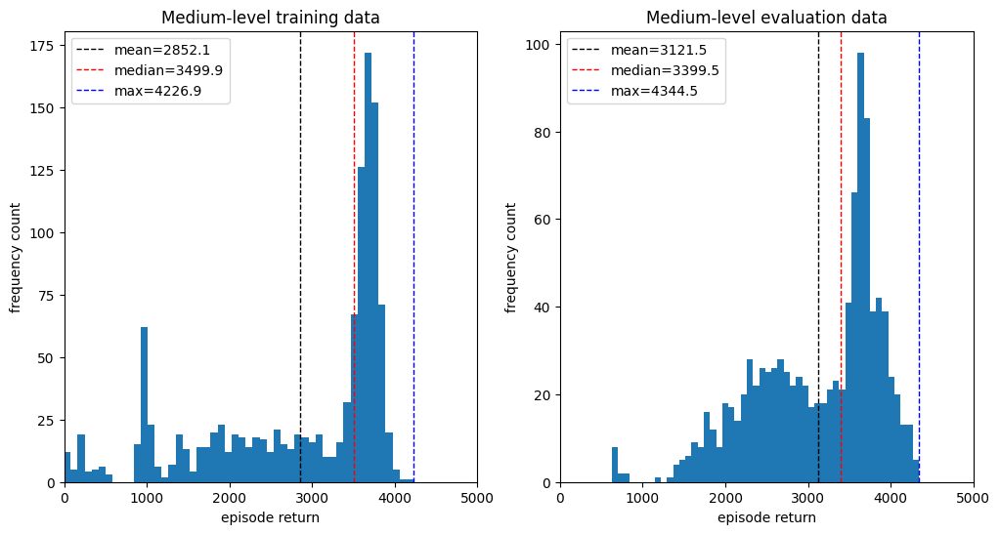

In [108]:
medium_training_returns = [np.sum(rewards) for rewards in datasets[0]['train']['rewards']]
medium_evaluation_returns = [np.sum(rewards) for rewards in medium_evaluation_rewards]

plot_returns(medium_training_returns, medium_evaluation_returns, ['Medium-level training data', 'Medium-level evaluation data'])

We can see in the above that the transformer obtains a better average and maximum return, but a lower median. This suggests that we do have some trajectories where the transformer outperforms the original data, but also many where it does not. If we were to train the transformer again from the evaluation trajectories we will likely need to weight the sampling, so we do not fit it to too many trajectories where it did worse.

In [99]:
# expert-level evaluations
expert_evaluation_rewards, _ = evaluate_episodes(1000, models[1], collators[1], record_video=False)

100%|██████████| 1000/1000 [43:28<00:00,  2.61s/it]


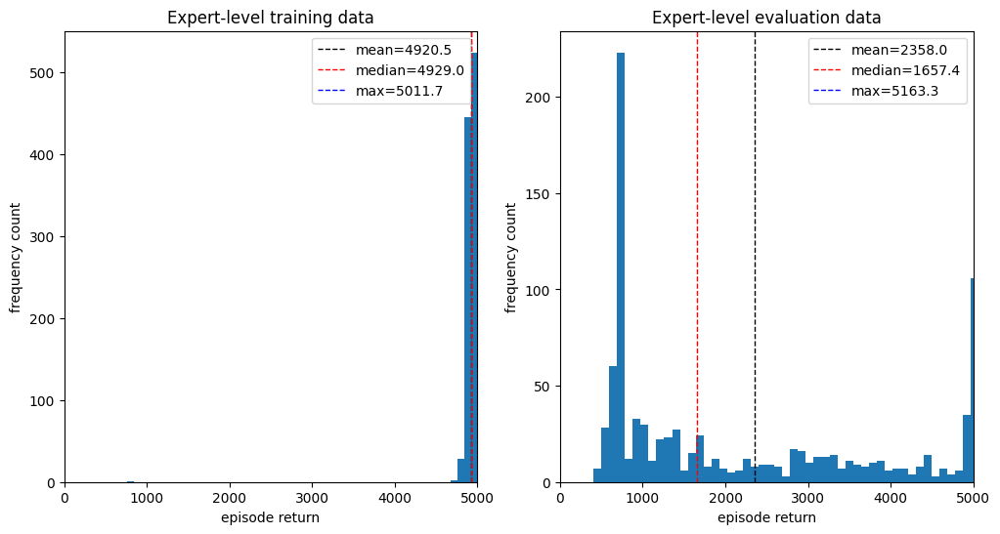

In [110]:
expert_training_returns = [np.sum(rewards) for rewards in datasets[1]['train']['rewards']]
expert_evaluation_returns = [np.sum(rewards) for rewards in expert_evaluation_rewards]

plot_returns(expert_training_returns, expert_evaluation_returns, ['Expert-level training data', 'Expert-level evaluation data'])

When we only train with expert data, we can observe that the transformer has a slightly higher maximum return, but a significantly lower mean and median (also vs. medium results). This volatile evaluation result with many low-return trajectories suggests the transformer is sensitive to noise and does not generalise well. A plausible explanation for this could be that the training data is too homogenuous and that the transformer ultimately overfit on it too much.

# Conclusion

We can see from the above that it should indeed be possible to train a decision transformer iteratively on its own evaluation trajectories. However, as the expert data has shown, a degree of heterogeneity in the data is necessary to yield stable training results.

## Videos
Below are two example videos of the trained medium and expert agents.

In [112]:
# Play medium level video
demo_rewards, demo_envs = evaluate_episodes(1, models[0], collators[0], record_video=True)
print(f'Episode Return for {dataset_names[0]}: {np.sum(demo_rewards[0])}')
demo_envs[0].play()

  0%|          | 0/1 [00:00<?, ?it/s]OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
100%|██████████| 1/1 [00:25<00:00, 25.17s/it]


Episode Return for walker2d-medium-v2: 3310.5433594518995
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [114]:
# Play expert level video
demo_rewards, demo_envs = evaluate_episodes(1, models[1], collators[1], record_video=True)
print(f'Episode Return for {dataset_names[1]}: {np.sum(demo_rewards[0])}')
demo_envs[0].play()

  0%|          | 0/1 [00:00<?, ?it/s]OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
100%|██████████| 1/1 [00:07<00:00,  8.00s/it]


Episode Return for walker2d-expert-v2: 692.8866116337717
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
